In [1]:
#import library 

import os
import glob
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tqdm import tqdm
from skimage.metrics import structural_similarity as ssim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

In [2]:
#baresi ejra rooye GPU ast ya CPU

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
#tarif dataset

class DIV2KPairDataset(Dataset):
    def __init__(self, cover_dir, secret_dir, transform=None, max_images=200):
        self.cover_paths = sorted(glob.glob(os.path.join(cover_dir, '*.png')))[:max_images]
        self.secret_paths = sorted(glob.glob(os.path.join(secret_dir, '*.png')))[:max_images]
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return min(len(self.cover_paths), len(self.secret_paths))

    def __getitem__(self, idx):
        cover = Image.open(self.cover_paths[idx]).convert('RGB')
        secret = Image.open(self.secret_paths[idx]).convert('RGB')
        return self.transform(cover), self.transform(secret)

# bargozari dade

dataset = DIV2KPairDataset("DIV2K_train_HR/cover", "DIV2K_train_HR/secret")
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
print(f"Total images: {len(dataset)}")



Total images: 100


In [ ]:
#tarif model ha

class SimpleHidingBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 3, 1)
        )

    def forward(self, cover, secret):
        x = torch.cat([cover, secret], dim=1)
        return self.encoder(x)

class SimpleRevealingBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 3, 1)
        )

    def forward(self, stego):
        return self.decoder(stego)

# sakht modelha
hiding_net = SimpleHidingBlock().to(device)
reveal_net = SimpleRevealingBlock().to(device)


In [5]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)


In [6]:
#amoozesh model

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)


for epoch in range(15):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


[Epoch 1] Loss: 0.1478


100%|██████████| 25/25 [00:19<00:00,  1.28it/s]


[Epoch 2] Loss: 0.0600


100%|██████████| 25/25 [00:15<00:00,  1.62it/s]


[Epoch 3] Loss: 0.0277


100%|██████████| 25/25 [00:15<00:00,  1.62it/s]


[Epoch 4] Loss: 0.0222


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 5] Loss: 0.0206


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 6] Loss: 0.0179


100%|██████████| 25/25 [00:15<00:00,  1.62it/s]


[Epoch 7] Loss: 0.0160


100%|██████████| 25/25 [00:15<00:00,  1.62it/s]


[Epoch 8] Loss: 0.0154


100%|██████████| 25/25 [00:15<00:00,  1.64it/s]


[Epoch 9] Loss: 0.0196


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 10] Loss: 0.0202


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 11] Loss: 0.0173


100%|██████████| 25/25 [00:15<00:00,  1.65it/s]


[Epoch 12] Loss: 0.0143


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 13] Loss: 0.0134


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 14] Loss: 0.0128


100%|██████████| 25/25 [00:18<00:00,  1.33it/s]

[Epoch 15] Loss: 0.0124


In [7]:
#test nahayi 

for i in range(4):
    cover, secret = dataset[i]
    cover = cover.unsqueeze(0).to(device)
    secret = secret.unsqueeze(0).to(device)

    with torch.no_grad():
        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

print("PSNR:", psnr(secret[0], recovered[0]))
print("SSIM:", compute_ssim(secret[0], recovered[0]))


PSNR: 20.898858252033648
SSIM: 0.87947804


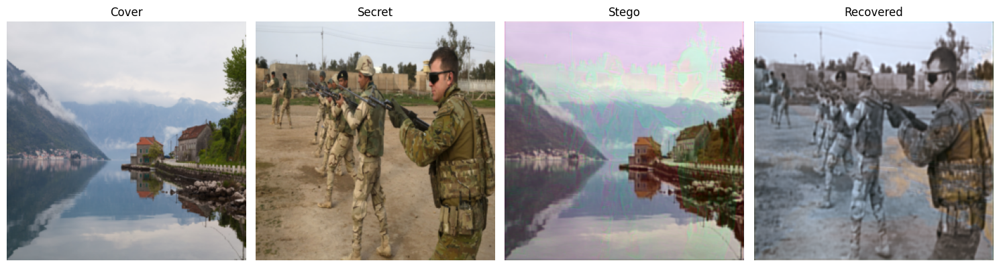

In [8]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

# نمایش 4 تصویر کنار هم
plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()


In [9]:
#marhale aval noavari :
# کانولوشن‌های 1×1، 3×3 و 5×5 گذاشتیم

# روی ترکیب Cover و Secret اعمال کردیم

# خروجی هر مسیر رو concat کردیم

# سپس یک لایه fusion (ترکیب) گذاشتیم

In [10]:
class MultiScaleHidingBlock(nn.Module):
    def __init__(self):
        super().__init__()

        # مسیر اول: کانولوشن 1×1 → ویژگی‌های دقیق محلی
        self.conv1x1 = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=1, padding=0),
            nn.ReLU()
        )

        # مسیر دوم: کانولوشن 3×3 → ویژگی‌های نرمال
        self.conv3x3 = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, padding=1),
            nn.ReLU()
        )

        # مسیر سوم: کانولوشن 5×5 → ویژگی‌های بزرگ‌تر و عمیق‌تر
        self.conv5x5 = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=5, padding=2),
            nn.ReLU()
        )

        # ادغام خروجی مسیرها + کاهش کانال‌ها به 3 کانال RGB
        self.fusion = nn.Sequential(
            nn.Conv2d(32 * 3, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 3, kernel_size=1)  # خروجی نهایی: تصویر Stego
        )

    def forward(self, cover, secret):
        # ترکیب cover و secret به عنوان ورودی
        x = torch.cat([cover, secret], dim=1)

        # اعمال سه مسیر کانولوشنی با مقیاس‌های مختلف
        x1 = self.conv1x1(x)
        x2 = self.conv3x3(x)
        x3 = self.conv5x5(x)

        # اتصال خروجی مسیرها به هم (کانکت کردن در بعد کانال)
        out = torch.cat([x1, x2, x3], dim=1)

        # عبور از لایه‌های نهایی و خروجی نهایی
        return self.fusion(out)


In [11]:
# استفاده از مدل جدید در آموزش
hiding_net = MultiScaleHidingBlock().to(device)
reveal_net = SimpleRevealingBlock().to(device)

In [12]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)

In [13]:
#amoozesh model (epoch = 100)

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)

for epoch in range(100):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:22<00:00,  1.09it/s]


[Epoch 1] Loss: 0.1330


100%|██████████| 25/25 [00:20<00:00,  1.20it/s]


[Epoch 2] Loss: 0.0579


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 3] Loss: 0.0316


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 4] Loss: 0.0223


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 5] Loss: 0.0234


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 6] Loss: 0.0211


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 7] Loss: 0.0171


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 8] Loss: 0.0161


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 9] Loss: 0.0155


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 10] Loss: 0.0201


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 11] Loss: 0.0248


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 12] Loss: 0.0169


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 13] Loss: 0.0144


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 14] Loss: 0.0133


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 15] Loss: 0.0127


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 16] Loss: 0.0123


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 17] Loss: 0.0121


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 18] Loss: 0.0114


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 19] Loss: 0.0114


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 20] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 21] Loss: 0.0114


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 22] Loss: 0.0110


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 23] Loss: 0.0120


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 24] Loss: 0.0127


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 25] Loss: 0.0108


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 26] Loss: 0.0107


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 27] Loss: 0.0106


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 28] Loss: 0.0109


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 29] Loss: 0.0105


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 30] Loss: 0.0104


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 31] Loss: 0.0104


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 32] Loss: 0.0127


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 33] Loss: 0.0108


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 34] Loss: 0.0100


100%|██████████| 25/25 [00:13<00:00,  1.90it/s]


[Epoch 35] Loss: 0.0098


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 36] Loss: 0.0100


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 37] Loss: 0.0104


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 38] Loss: 0.0097


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 39] Loss: 0.0102


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 40] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 41] Loss: 0.0108


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 42] Loss: 0.0102


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 43] Loss: 0.0097


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 44] Loss: 0.0094


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 45] Loss: 0.0096


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 46] Loss: 0.0091


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 47] Loss: 0.0098


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 48] Loss: 0.0098


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 49] Loss: 0.0098


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 50] Loss: 0.0099


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 51] Loss: 0.0094


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 52] Loss: 0.0091


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 53] Loss: 0.0093


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 54] Loss: 0.0096


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 55] Loss: 0.0092


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 56] Loss: 0.0109


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 57] Loss: 0.0103


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 58] Loss: 0.0091


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 59] Loss: 0.0089


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 60] Loss: 0.0090


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 61] Loss: 0.0092


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 62] Loss: 0.0116


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 63] Loss: 0.0095


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 64] Loss: 0.0089


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 65] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 66] Loss: 0.0087


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 67] Loss: 0.0089


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 68] Loss: 0.0089


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 69] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 70] Loss: 0.0085


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 71] Loss: 0.0103


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 72] Loss: 0.0095


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 73] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 74] Loss: 0.0086


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 75] Loss: 0.0087


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 76] Loss: 0.0085


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 77] Loss: 0.0087


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 78] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 79] Loss: 0.0093


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 80] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 81] Loss: 0.0087


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 82] Loss: 0.0140


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 83] Loss: 0.0116


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 84] Loss: 0.0093


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 85] Loss: 0.0087


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 86] Loss: 0.0085


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 87] Loss: 0.0083


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 88] Loss: 0.0084


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 89] Loss: 0.0087


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 90] Loss: 0.0085


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 91] Loss: 0.0085


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 92] Loss: 0.0082


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 93] Loss: 0.0083


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 94] Loss: 0.0081


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 95] Loss: 0.0081


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 96] Loss: 0.0082


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 97] Loss: 0.0092


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 98] Loss: 0.0099


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 99] Loss: 0.0089


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]

[Epoch 100] Loss: 0.0085


In [14]:
#test nahayi 

cover, secret = dataset[0]
cover = cover.unsqueeze(0).to(device)
secret = secret.unsqueeze(0).to(device)

with torch.no_grad():
    stego = hiding_net(cover, secret)
    recovered = reveal_net(stego)

print("PSNR:", psnr(secret[0], recovered[0]))
print("SSIM:", compute_ssim(secret[0], recovered[0]))



PSNR: 25.636278621979738
SSIM: 0.9167779


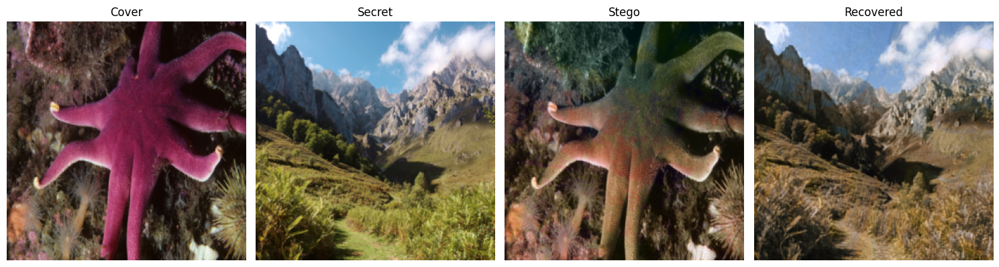

In [ ]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()


In [16]:
#marhale dovom noavari :
#تست مقاومت مدل در برابر تغییر اندازه تصویر 
#Resolution Robustness

In [17]:
from torchvision.transforms import Resize

def resize_images(cover, secret, size=(128, 128)):
    resize = Resize(size)
    cover_resized = resize(cover)
    secret_resized = resize(secret)
    return cover_resized, secret_resized

In [ ]:
# سایزهای مختلف برای تست
sizes = [(128, 128), (256, 256), (512, 512)]

# ذخیره نتایج برای مقایسه
results = []

for size in sizes:
    # تغییر اندازه cover و secret
    cover_resized, secret_resized = resize_images(cover[0].unsqueeze(0), secret[0].unsqueeze(0), size)

    # انتقال به GPU یا CPU
    cover_resized = cover_resized.to(device)
    secret_resized = secret_resized.to(device)

    # عبور از مدل
    stego_resized = hiding_net(cover_resized, secret_resized)
    recovered_resized = reveal_net(stego_resized)

    # محاسبه PSNR و SSIM
    psnr_val = psnr(secret_resized[0], recovered_resized[0])
    ssim_val = compute_ssim(secret_resized[0], recovered_resized[0])

    # ذخیره نتیجه
    results.append((size, psnr_val, ssim_val))

    print(f"Size: {size}  →  PSNR: {psnr_val:.2f} dB, SSIM: {ssim_val:.4f}")

#هر چقدر کاهش کمتر باشه یعنی مدل در برابر تغییر اندازه مقاوم‌تره : نتیجه 

Size: (128, 128)  →  PSNR: 25.82 dB, SSIM: 0.9219
Size: (256, 256)  →  PSNR: 25.64 dB, SSIM: 0.9168
Size: (512, 512)  →  PSNR: 25.90 dB, SSIM: 0.9309


In [19]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

def show_all(size, cover, secret, stego, recovered):
    to_pil = transforms.ToPILImage()

    images = [cover, secret, stego, recovered]
    titles = [f'Cover {size}', f'Secret {size}', f'Stego {size}', f'Recovered {size}']

    fig, axs = plt.subplots(1, 4, figsize=(18, 5))

    for i in range(4):
        img = to_pil(images[i].detach().cpu().clamp(0, 1))  # اطمینان از محدوده [0,1]
        #detach : تضمین می‌کنه تصویر از گراف محاسباتی جدا بشه و روی CPU باشه
        axs[i].imshow(img)
        axs[i].set_title(titles[i])
        axs[i].axis('off')

    plt.tight_layout() #نوشته ها به هم نچسبن 
    plt.show()


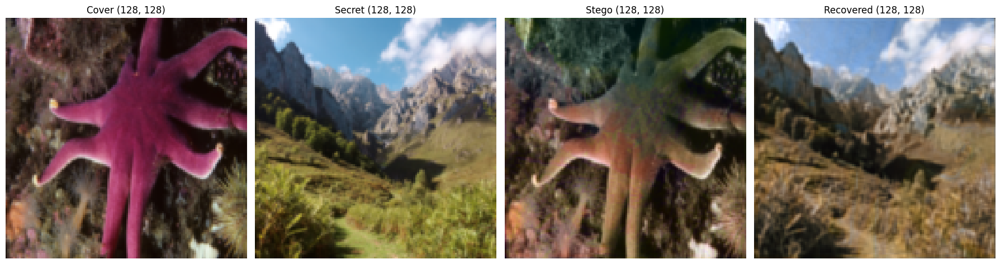

In [20]:
size = (128, 128)
cover_r, secret_r = resize_images(cover[0].unsqueeze(0), secret[0].unsqueeze(0), size)
stego_r = hiding_net(cover_r.to(device), secret_r.to(device))
recovered_r = reveal_net(stego_r)

show_all(size, cover_r[0], secret_r[0], stego_r[0].cpu(), recovered_r[0].cpu())



In [21]:
#marhale sevom 

#طراحی AutoEncoder چندمقیاسی برای Steganography

In [22]:
import torch
import torch.nn as nn

class AutoEncoderHidingBlock(nn.Module):
    def __init__(self):
        super().__init__()

        #Encoder: کاهش ابعاد و استخراج ویژگی‌ها در چند سطح
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, padding=1),  # ترکیب cover + secret → 6 کانال
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, padding=1, stride=2), 
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, padding=1, stride=2), 
            nn.ReLU()
        )

        #Decoder: بازسازی تصویر با ConvTranspose2d برای کیفیت بهتر
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1), 
            nn.ReLU(),
            nn.Conv2d(32, 3, kernel_size=3, padding=1)  # خروجی نهایی: تصویر Stego (3 کاناله)
        )

    def forward(self, cover, secret):
        # ترکیب cover و secret به‌عنوان ورودی
        x = torch.cat([cover, secret], dim=1) 

        # عبور از Encoder و Decoder
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)

        return decoded  # این تصویر stego نهایی است

In [23]:
# جایگزینی Hiding Block قبلی با AutoEncoder جدید
hiding_net = AutoEncoderHidingBlock().to(device)
reveal_net = SimpleRevealingBlock().to(device)  # همون مدل قبلی برای بازیابی

In [24]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)

In [25]:
#amoozesh model (epoch = 100)

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)

for epoch in range(100):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 1] Loss: 0.1699


100%|██████████| 25/25 [00:13<00:00,  1.79it/s]


[Epoch 2] Loss: 0.0980


100%|██████████| 25/25 [00:13<00:00,  1.80it/s]


[Epoch 3] Loss: 0.0906


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 4] Loss: 0.0851


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 5] Loss: 0.0833


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 6] Loss: 0.0817


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 7] Loss: 0.0806


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 8] Loss: 0.0769


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 9] Loss: 0.0690


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 10] Loss: 0.0510


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 11] Loss: 0.0353


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 12] Loss: 0.0324


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 13] Loss: 0.0303


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 14] Loss: 0.0395


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 15] Loss: 0.0340


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 16] Loss: 0.0291


100%|██████████| 25/25 [00:18<00:00,  1.34it/s]


[Epoch 17] Loss: 0.0269


100%|██████████| 25/25 [00:19<00:00,  1.29it/s]


[Epoch 18] Loss: 0.0251


100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


[Epoch 19] Loss: 0.0228


100%|██████████| 25/25 [00:19<00:00,  1.28it/s]


[Epoch 20] Loss: 0.0204


100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


[Epoch 21] Loss: 0.0230


100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


[Epoch 22] Loss: 0.0209


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 23] Loss: 0.0197


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 24] Loss: 0.0189


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 25] Loss: 0.0172


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 26] Loss: 0.0165


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 27] Loss: 0.0241


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 28] Loss: 0.0311


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 29] Loss: 0.0213


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 30] Loss: 0.0174


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 31] Loss: 0.0163


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 32] Loss: 0.0156


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 33] Loss: 0.0153


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 34] Loss: 0.0171


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 35] Loss: 0.0173


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 36] Loss: 0.0159


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 37] Loss: 0.0145


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 38] Loss: 0.0145


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 39] Loss: 0.0147


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 40] Loss: 0.0143


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 41] Loss: 0.0141


100%|██████████| 25/25 [00:13<00:00,  1.81it/s]


[Epoch 42] Loss: 0.0136


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 43] Loss: 0.0134


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 44] Loss: 0.0139


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 45] Loss: 0.0151


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 46] Loss: 0.0158


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 47] Loss: 0.0140


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 48] Loss: 0.0133


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 49] Loss: 0.0138


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 50] Loss: 0.0143


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 51] Loss: 0.0141


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 52] Loss: 0.0141


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 53] Loss: 0.0141


100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


[Epoch 54] Loss: 0.0143


100%|██████████| 25/25 [00:18<00:00,  1.34it/s]


[Epoch 55] Loss: 0.0149


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 56] Loss: 0.0152


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 57] Loss: 0.0130


100%|██████████| 25/25 [00:14<00:00,  1.79it/s]


[Epoch 58] Loss: 0.0126


100%|██████████| 25/25 [00:14<00:00,  1.72it/s]


[Epoch 59] Loss: 0.0125


100%|██████████| 25/25 [00:13<00:00,  1.82it/s]


[Epoch 60] Loss: 0.0124


100%|██████████| 25/25 [00:13<00:00,  1.82it/s]


[Epoch 61] Loss: 0.0121


100%|██████████| 25/25 [00:13<00:00,  1.80it/s]


[Epoch 62] Loss: 0.0122


100%|██████████| 25/25 [00:13<00:00,  1.81it/s]


[Epoch 63] Loss: 0.0121


100%|██████████| 25/25 [00:13<00:00,  1.81it/s]


[Epoch 64] Loss: 0.0125


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 65] Loss: 0.0124


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 66] Loss: 0.0122


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 67] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 68] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 69] Loss: 0.0146


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 70] Loss: 0.0149


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 71] Loss: 0.0121


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 72] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 73] Loss: 0.0128


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 74] Loss: 0.0128


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 75] Loss: 0.0120


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 76] Loss: 0.0134


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 77] Loss: 0.0120


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 78] Loss: 0.0122


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 79] Loss: 0.0134


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 80] Loss: 0.0118


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 81] Loss: 0.0115


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 82] Loss: 0.0123


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 83] Loss: 0.0121


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 84] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 85] Loss: 0.0134


100%|██████████| 25/25 [00:14<00:00,  1.71it/s]


[Epoch 86] Loss: 0.0155


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 87] Loss: 0.0158


100%|██████████| 25/25 [00:15<00:00,  1.65it/s]


[Epoch 88] Loss: 0.0126


100%|██████████| 25/25 [00:20<00:00,  1.24it/s]


[Epoch 89] Loss: 0.0117


100%|██████████| 25/25 [00:19<00:00,  1.28it/s]


[Epoch 90] Loss: 0.0117


100%|██████████| 25/25 [00:19<00:00,  1.28it/s]


[Epoch 91] Loss: 0.0117


100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


[Epoch 92] Loss: 0.0128


100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


[Epoch 93] Loss: 0.0134


100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


[Epoch 94] Loss: 0.0138


100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


[Epoch 95] Loss: 0.0135


100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


[Epoch 96] Loss: 0.0122


100%|██████████| 25/25 [00:19<00:00,  1.27it/s]


[Epoch 97] Loss: 0.0115


100%|██████████| 25/25 [00:19<00:00,  1.28it/s]


[Epoch 98] Loss: 0.0111


100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


[Epoch 99] Loss: 0.0115


100%|██████████| 25/25 [00:18<00:00,  1.34it/s]

[Epoch 100] Loss: 0.0117


In [26]:
# test nahayi 

with torch.no_grad():
    stego = hiding_net(cover, secret)
    recovered = reveal_net(stego)

    print("PSNR:", psnr(secret[0], recovered[0]))
    print("SSIM:", compute_ssim(secret[0], recovered[0]))

PSNR: 22.116487541321543
SSIM: 0.7491557


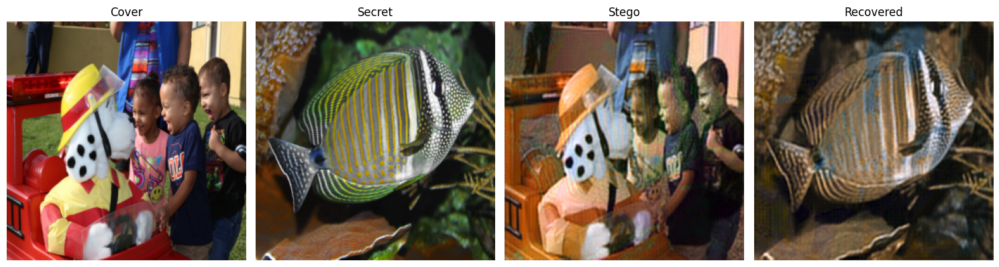

In [ ]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()


In [28]:
# UNet ساده‌شده برای پنهان‌سازی تصویر ---> baraye behbood model autoencoder

# این مدل شامل:

# Encoder با 2 مرحله

# Decoder با 2 مرحله

# Skip connection بین Encoder و Decoder

# خروجی 3 کاناله Stego image

In [29]:
import torch
import torch.nn as nn

class UNetHidingBlock(nn.Module):
    def __init__(self):
        super().__init__()

        #Encoder: استخراج ویژگی‌ها و کاهش ابعاد
        self.enc1 = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # downsample 1/2
            nn.ReLU()
        )

        #Bottleneck: فشرده‌ترین سطح ویژگی
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU()
        )

        #Decoder: بازسازی تصویر به اندازه اصلی
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # upsample
            nn.ReLU()
        )
        self.dec2 = nn.Sequential(
            nn.Conv2d(64 + 32, 32, kernel_size=3, padding=1),  # Skip connection
            nn.ReLU(),
            nn.Conv2d(32, 3, kernel_size=3, padding=1)  # خروجی 3 کاناله (RGB)
        )

    def forward(self, cover, secret):
        #ترکیب اولیه ورودی‌ها
        x = torch.cat([cover, secret], dim=1)  

        #عبور از Encoder
        e1 = self.enc1(x)       
        e2 = self.enc2(e1)       

        #Bottleneck
        b = self.bottleneck(e2)  

        #Decoder + Skip connection
        d1 = self.dec1(b)        
        d1_cat = torch.cat([d1, e1], dim=1) 
        out = self.dec2(d1_cat)  

        return out


In [30]:
hiding_net = UNetHidingBlock().to(device)
reveal_net = SimpleRevealingBlock().to(device)

In [31]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)

In [33]:
#amoozesh model (epoch = 100)

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)

for epoch in range(100):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:16<00:00,  1.56it/s]


[Epoch 1] Loss: 0.1176


100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


[Epoch 2] Loss: 0.0499


100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


[Epoch 3] Loss: 0.0303


100%|██████████| 25/25 [00:18<00:00,  1.34it/s]


[Epoch 4] Loss: 0.0234


100%|██████████| 25/25 [00:18<00:00,  1.34it/s]


[Epoch 5] Loss: 0.0210


100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


[Epoch 6] Loss: 0.0218


100%|██████████| 25/25 [00:19<00:00,  1.31it/s]


[Epoch 7] Loss: 0.0183


100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


[Epoch 8] Loss: 0.0168


100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


[Epoch 9] Loss: 0.0163


100%|██████████| 25/25 [00:19<00:00,  1.31it/s]


[Epoch 10] Loss: 0.0148


100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


[Epoch 11] Loss: 0.0144


100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


[Epoch 12] Loss: 0.0140


100%|██████████| 25/25 [00:19<00:00,  1.30it/s]


[Epoch 13] Loss: 0.0158


100%|██████████| 25/25 [00:19<00:00,  1.30it/s]


[Epoch 14] Loss: 0.0137


100%|██████████| 25/25 [00:19<00:00,  1.25it/s]


[Epoch 15] Loss: 0.0142


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 16] Loss: 0.0134


100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


[Epoch 17] Loss: 0.0142


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 18] Loss: 0.0129


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 19] Loss: 0.0123


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 20] Loss: 0.0120


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 21] Loss: 0.0143


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 22] Loss: 0.0192


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 23] Loss: 0.0134


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 24] Loss: 0.0120


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 25] Loss: 0.0117


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 26] Loss: 0.0113


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 27] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 28] Loss: 0.0108


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 29] Loss: 0.0105


100%|██████████| 25/25 [00:13<00:00,  1.89it/s]


[Epoch 30] Loss: 0.0110


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 31] Loss: 0.0136


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 32] Loss: 0.0110


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 33] Loss: 0.0104


100%|██████████| 25/25 [00:13<00:00,  1.88it/s]


[Epoch 34] Loss: 0.0125


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 35] Loss: 0.0140


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 36] Loss: 0.0114


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 37] Loss: 0.0106


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 38] Loss: 0.0109


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 39] Loss: 0.0111


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 40] Loss: 0.0120


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 41] Loss: 0.0106


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 42] Loss: 0.0115


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 43] Loss: 0.0105


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 44] Loss: 0.0101


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 45] Loss: 0.0099


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 46] Loss: 0.0099


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 47] Loss: 0.0110


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 48] Loss: 0.0108


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 49] Loss: 0.0098


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 50] Loss: 0.0223


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 51] Loss: 0.0181


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 52] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 53] Loss: 0.0107


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 54] Loss: 0.0103


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 55] Loss: 0.0099


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 56] Loss: 0.0099


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 57] Loss: 0.0097


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 58] Loss: 0.0094


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 59] Loss: 0.0115


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 60] Loss: 0.0122


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 61] Loss: 0.0095


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 62] Loss: 0.0096


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 63] Loss: 0.0102


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 64] Loss: 0.0097


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 65] Loss: 0.0094


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 66] Loss: 0.0091


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 67] Loss: 0.0091


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 68] Loss: 0.0094


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 69] Loss: 0.0111


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 70] Loss: 0.0105


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 71] Loss: 0.0097


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 72] Loss: 0.0093


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 73] Loss: 0.0089


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 74] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 75] Loss: 0.0095


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 76] Loss: 0.0119


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 77] Loss: 0.0098


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 78] Loss: 0.0099


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 79] Loss: 0.0112


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 80] Loss: 0.0101


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 81] Loss: 0.0092


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 82] Loss: 0.0091


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 83] Loss: 0.0092


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 84] Loss: 0.0087


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 85] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 86] Loss: 0.0103


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 87] Loss: 0.0090


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 88] Loss: 0.0090


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 89] Loss: 0.0097


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 90] Loss: 0.0089


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 91] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 92] Loss: 0.0088


100%|██████████| 25/25 [00:13<00:00,  1.82it/s]


[Epoch 93] Loss: 0.0113


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 94] Loss: 0.0096


100%|██████████| 25/25 [00:13<00:00,  1.85it/s]


[Epoch 95] Loss: 0.0090


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]


[Epoch 96] Loss: 0.0085


100%|██████████| 25/25 [00:13<00:00,  1.83it/s]


[Epoch 97] Loss: 0.0084


100%|██████████| 25/25 [00:13<00:00,  1.86it/s]


[Epoch 98] Loss: 0.0086


100%|██████████| 25/25 [00:13<00:00,  1.87it/s]


[Epoch 99] Loss: 0.0083


100%|██████████| 25/25 [00:13<00:00,  1.84it/s]

[Epoch 100] Loss: 0.0092


In [34]:
# test nahayi 

with torch.no_grad():
    stego = hiding_net(cover, secret)
    recovered = reveal_net(stego)

    print("PSNR:", psnr(secret[0], recovered[0]))
    print("SSIM:", compute_ssim(secret[0], recovered[0]))

PSNR: 26.450972698959024
SSIM: 0.86926776


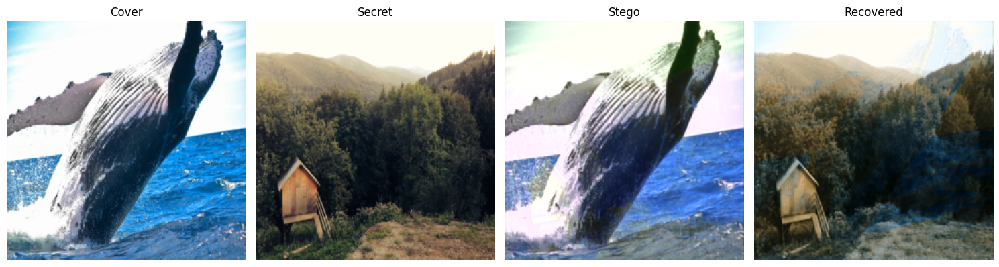

In [ ]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()

In [36]:
#marhale chaharom 

#تست مقاومت در برابر کشف (Steganalysis)
#محاسبه دقت تشخیص

In [37]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os

#ساخت دیتاست Stego + Cover

class StegoDataset(Dataset):
    def __init__(self, cover_dir, stego_dir, transform=None):
        self.transform = transform
        self.cover_paths = sorted([os.path.join(cover_dir, img) for img in os.listdir(cover_dir)])
        self.stego_paths = sorted([os.path.join(stego_dir, img) for img in os.listdir(stego_dir)])

        self.data = [(p, 0) for p in self.cover_paths] + [(p, 1) for p in self.stego_paths]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        path, label = self.data[idx]
        image = Image.open(path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.float32)

In [38]:
# آماده‌سازی دیتای ورودی

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

cover_path = "DIV2K_train_HR/cover"
stego_path = "DIV2K_train_HR/stego"

dataset = StegoDataset(cover_path, stego_path, transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

print(f"Total images loaded: {len(dataset)}")


Total images loaded: 200


In [39]:
#tarif model CNN baraye tashkhis stego

class SteganalyzerCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),  # 128

            nn.Conv2d(16, 32, kernel_size=3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),  # 64

            nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.ReLU(),
            nn.AdaptiveAvgPool2d(1),  # [B, 64, 1, 1]

            nn.Flatten(),
            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)

In [40]:
#آموزش مدل

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SteganalyzerCNN().to(device)

criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# آموزش 5 دوره
for epoch in range(5):
    running_loss = 0.0
    correct = 0
    total = 0

    for imgs, labels in dataloader:
        imgs, labels = imgs.to(device), labels.to(device).unsqueeze(1)

        outputs = model(imgs)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        preds = (outputs > 0.5).float()
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    acc = 100 * correct / total
    print(f"Epoch {epoch+1} | Loss: {running_loss:.4f} | Accuracy: {acc:.2f}%")


Epoch 1 | Loss: 9.0156 | Accuracy: 50.00%
Epoch 2 | Loss: 9.0117 | Accuracy: 50.00%
Epoch 3 | Loss: 9.0083 | Accuracy: 50.00%
Epoch 4 | Loss: 9.0127 | Accuracy: 50.00%
Epoch 5 | Loss: 9.0090 | Accuracy: 50.00%


In [ ]:
#embedding Block with Multi-Scale conv

In [53]:
#tarif dataset

class DIV2KPairDataset(Dataset):
    def __init__(self, cover_dir, secret_dir, transform=None, max_images=500):
        self.cover_paths = sorted(glob.glob(os.path.join(cover_dir, '*.png')))[:max_images]
        self.secret_paths = sorted(glob.glob(os.path.join(secret_dir, '*.png')))[:max_images]
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return min(len(self.cover_paths), len(self.secret_paths))

    def __getitem__(self, idx):
        cover = Image.open(self.cover_paths[idx]).convert('RGB')
        secret = Image.open(self.secret_paths[idx]).convert('RGB')
        return self.transform(cover), self.transform(secret)

# بارگذاری داده

dataset = DIV2KPairDataset("DIV2K_train_HR/cover", "DIV2K_train_HR/secret")
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
print(f"Total images: {len(dataset)}")



Total images: 100


In [54]:
class MultiScaleEmbeddingHidingBlock(nn.Module):
    def __init__(self):
        super().__init__()

        # مسیر اول: کانولوشن 1×1 → ویژگی‌های دقیق محلی
        self.conv1x1 = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=1, padding=0),
            nn.ReLU()
        )

        # مسیر دوم: کانولوشن 3×3 → ویژگی‌های نرمال
        self.conv3x3 = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=3, padding=1),
            nn.ReLU()
        )

        # مسیر سوم: کانولوشن 5×5 → ویژگی‌های بزرگ‌تر و عمیق‌تر
        self.conv5x5 = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=5, padding=2),
            nn.ReLU()
        )

        # ادغام خروجی مسیرها + افزایش embedding size و حفظ قدرت بازسازی
        self.fusion = nn.Sequential(
            nn.Conv2d(64 * 3, 128, kernel_size=3, padding=1),  # افزایش عمق به 128
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 3, kernel_size=1)  # خروجی نهایی: Stego image
        )

    def forward(self, cover, secret):
        x = torch.cat([cover, secret], dim=1)
        x1 = self.conv1x1(x)
        x2 = self.conv3x3(x)
        x3 = self.conv5x5(x)
        out = torch.cat([x1, x2, x3], dim=1)
        return self.fusion(out)


In [55]:
# استفاده از مدل جدید در آموزش
hiding_net = MultiScaleEmbeddingHidingBlock().to(device)
reveal_net = SimpleRevealingBlock().to(device)

In [56]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)

In [57]:
#amoozesh model (epoch = 100)

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)

for epoch in range(100):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:15<00:00,  1.63it/s]


[Epoch 1] Loss: 0.1467


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 2] Loss: 0.0587


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 3] Loss: 0.0355


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 4] Loss: 0.0295


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 5] Loss: 0.0292


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 6] Loss: 0.0226


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 7] Loss: 0.0188


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 8] Loss: 0.0185


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 9] Loss: 0.0192


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 10] Loss: 0.0171


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 11] Loss: 0.0159


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 12] Loss: 0.0142


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 13] Loss: 0.0135


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 14] Loss: 0.0148


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 15] Loss: 0.0171


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 16] Loss: 0.0134


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 17] Loss: 0.0126


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 18] Loss: 0.0129


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 19] Loss: 0.0136


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 20] Loss: 0.0279


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 21] Loss: 0.0236


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 22] Loss: 0.0148


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 23] Loss: 0.0128


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 24] Loss: 0.0122


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 25] Loss: 0.0120


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 26] Loss: 0.0115


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 27] Loss: 0.0111


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 28] Loss: 0.0109


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 29] Loss: 0.0107


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 30] Loss: 0.0104


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 31] Loss: 0.0144


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 32] Loss: 0.0116


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 33] Loss: 0.0109


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 34] Loss: 0.0104


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 35] Loss: 0.0101


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 36] Loss: 0.0100


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 37] Loss: 0.0103


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 38] Loss: 0.0111


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 39] Loss: 0.0124


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 40] Loss: 0.0101


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 41] Loss: 0.0106


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 42] Loss: 0.0143


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 43] Loss: 0.0135


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 44] Loss: 0.0105


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 45] Loss: 0.0099


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 46] Loss: 0.0097


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 47] Loss: 0.0095


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 48] Loss: 0.0092


100%|██████████| 25/25 [00:15<00:00,  1.65it/s]


[Epoch 49] Loss: 0.0098


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 50] Loss: 0.0104


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 51] Loss: 0.0102


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 52] Loss: 0.0094


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 53] Loss: 0.0104


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 54] Loss: 0.0124


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 55] Loss: 0.0099


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 56] Loss: 0.0090


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 57] Loss: 0.0090


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 58] Loss: 0.0098


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 59] Loss: 0.0093


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 60] Loss: 0.0091


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 61] Loss: 0.0098


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 62] Loss: 0.0091


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 63] Loss: 0.0089


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 64] Loss: 0.0091


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 65] Loss: 0.0089


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 66] Loss: 0.0119


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 67] Loss: 0.0100


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 68] Loss: 0.0093


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 69] Loss: 0.0086


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 70] Loss: 0.0087


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 71] Loss: 0.0089


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 72] Loss: 0.0095


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 73] Loss: 0.0097


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 74] Loss: 0.0099


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 75] Loss: 0.0101


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 76] Loss: 0.0089


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 77] Loss: 0.0087


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 78] Loss: 0.0091


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 79] Loss: 0.0087


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 80] Loss: 0.0084


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 81] Loss: 0.0082


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 82] Loss: 0.0086


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 83] Loss: 0.0083


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 84] Loss: 0.0084


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 85] Loss: 0.0088


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 86] Loss: 0.0101


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 87] Loss: 0.0106


100%|██████████| 25/25 [00:14<00:00,  1.68it/s]


[Epoch 88] Loss: 0.0104


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 89] Loss: 0.0096


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 90] Loss: 0.0085


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 91] Loss: 0.0088


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 92] Loss: 0.0087


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 93] Loss: 0.0084


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 94] Loss: 0.0083


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 95] Loss: 0.0080


100%|██████████| 25/25 [00:15<00:00,  1.66it/s]


[Epoch 96] Loss: 0.0079


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 97] Loss: 0.0082


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]


[Epoch 98] Loss: 0.0102


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 99] Loss: 0.0094


100%|██████████| 25/25 [00:15<00:00,  1.67it/s]

[Epoch 100] Loss: 0.0085


In [58]:
#test nahayi 

cover, secret = dataset[0]
cover = cover.unsqueeze(0).to(device)
secret = secret.unsqueeze(0).to(device)

with torch.no_grad():
    stego = hiding_net(cover, secret)
    recovered = reveal_net(stego)

print("PSNR:", psnr(secret[0], recovered[0]))
print("SSIM:", compute_ssim(secret[0], recovered[0]))

PSNR: 26.78522927916167
SSIM: 0.9151793


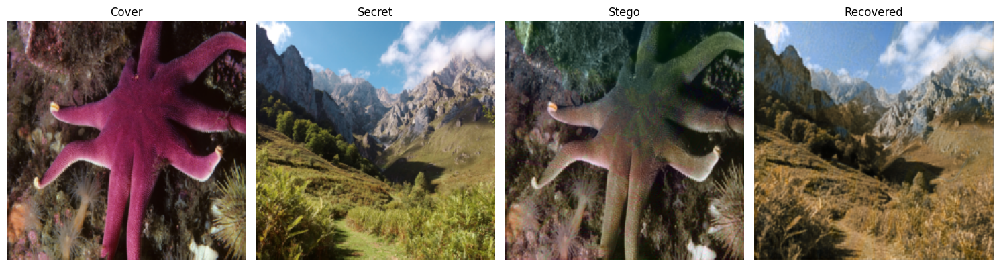

In [ ]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()

In [67]:
#embedding Block with Unet

In [68]:
#tarif dataset

class DIV2KPairDataset(Dataset):
    def __init__(self, cover_dir, secret_dir, transform=None, max_images=500):
        self.cover_paths = sorted(glob.glob(os.path.join(cover_dir, '*.png')))[:max_images]
        self.secret_paths = sorted(glob.glob(os.path.join(secret_dir, '*.png')))[:max_images]
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return min(len(self.cover_paths), len(self.secret_paths))

    def __getitem__(self, idx):
        cover = Image.open(self.cover_paths[idx]).convert('RGB')
        secret = Image.open(self.secret_paths[idx]).convert('RGB')
        return self.transform(cover), self.transform(secret)

# بارگذاری داده

dataset = DIV2KPairDataset("DIV2K_train_HR/cover", "DIV2K_train_HR/secret")
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
print(f"Total images: {len(dataset)}")



Total images: 100


In [69]:
import torch
import torch.nn as nn

class UNetWithEmbedding(nn.Module):
    def __init__(self):
        super().__init__()

        #1. Embedding Block: فشرده‌سازی تصویر محرمانه
        self.secret_embedding = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.ReLU()
        )

        #2. UNet Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(3 + 32, 32, kernel_size=3, padding=1),  # 3=Cover + 32=Secret Embedding
            nn.ReLU()
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU()
        )

        #3. Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU()
        )

        #4. Decoder
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU()
        )
        self.dec2 = nn.Sequential(
            nn.Conv2d(64 + 32, 32, kernel_size=3, padding=1),  # Skip connection
            nn.ReLU(),
            nn.Conv2d(32, 3, kernel_size=3, padding=1)  # خروجی 3 کاناله RGB
        )

    def forward(self, cover, secret):
        # مرحله اول: فشرده‌سازی ویژگی‌های تصویر محرمانه
        secret_feat = self.secret_embedding(secret)

        # ترکیب cover و ویژگی‌های فشرده‌شده‌ی secret
        x = torch.cat([cover, secret_feat], dim=1)

        # عبور از مسیر UNet
        e1 = self.enc1(x)
        e2 = self.enc2(e1)
        b = self.bottleneck(e2)
        d1 = self.dec1(b)
        d1_cat = torch.cat([d1, e1], dim=1)
        out = self.dec2(d1_cat)

        return out


In [70]:
hiding_net = UNetWithEmbedding().to(device)
reveal_net = SimpleRevealingBlock().to(device)

In [71]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)

In [72]:
#amoozesh model (epoch = 100)

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)

for epoch in range(100):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:16<00:00,  1.48it/s]


[Epoch 1] Loss: 0.1722


100%|██████████| 25/25 [00:19<00:00,  1.29it/s]


[Epoch 2] Loss: 0.0719


100%|██████████| 25/25 [00:17<00:00,  1.46it/s]


[Epoch 3] Loss: 0.0387


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 4] Loss: 0.0271


100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


[Epoch 5] Loss: 0.0227


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 6] Loss: 0.0225


100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


[Epoch 7] Loss: 0.0197


100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


[Epoch 8] Loss: 0.0196


100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


[Epoch 9] Loss: 0.0169


100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


[Epoch 10] Loss: 0.0184


100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


[Epoch 11] Loss: 0.0163


100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


[Epoch 12] Loss: 0.0195


100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


[Epoch 13] Loss: 0.0196


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 14] Loss: 0.0153


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 15] Loss: 0.0145


100%|██████████| 25/25 [00:15<00:00,  1.56it/s]


[Epoch 16] Loss: 0.0141


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 17] Loss: 0.0133


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 18] Loss: 0.0131


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 19] Loss: 0.0228


100%|██████████| 25/25 [00:16<00:00,  1.56it/s]


[Epoch 20] Loss: 0.0149


100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


[Epoch 21] Loss: 0.0133


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 22] Loss: 0.0129


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 23] Loss: 0.0126


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 24] Loss: 0.0123


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 25] Loss: 0.0119


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 26] Loss: 0.0117


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 27] Loss: 0.0115


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 28] Loss: 0.0117


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 29] Loss: 0.0119


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 30] Loss: 0.0118


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 31] Loss: 0.0111


100%|██████████| 25/25 [00:16<00:00,  1.56it/s]


[Epoch 32] Loss: 0.0129


100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


[Epoch 33] Loss: 0.0124


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 34] Loss: 0.0108


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 35] Loss: 0.0108


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 36] Loss: 0.0112


100%|██████████| 25/25 [00:15<00:00,  1.56it/s]


[Epoch 37] Loss: 0.0169


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 38] Loss: 0.0141


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 39] Loss: 0.0113


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 40] Loss: 0.0105


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 41] Loss: 0.0101


100%|██████████| 25/25 [00:16<00:00,  1.55it/s]


[Epoch 42] Loss: 0.0103


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 43] Loss: 0.0108


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 44] Loss: 0.0105


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 45] Loss: 0.0104


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 46] Loss: 0.0101


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 47] Loss: 0.0101


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 48] Loss: 0.0106


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 49] Loss: 0.0102


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 50] Loss: 0.0107


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 51] Loss: 0.0099


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 52] Loss: 0.0095


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 53] Loss: 0.0106


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 54] Loss: 0.0174


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 55] Loss: 0.0207


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 56] Loss: 0.0138


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 57] Loss: 0.0120


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 58] Loss: 0.0109


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 59] Loss: 0.0100


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 60] Loss: 0.0097


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 61] Loss: 0.0098


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 62] Loss: 0.0095


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 63] Loss: 0.0093


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 64] Loss: 0.0100


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 65] Loss: 0.0106


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 66] Loss: 0.0095


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 67] Loss: 0.0093


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 68] Loss: 0.0109


100%|██████████| 25/25 [00:15<00:00,  1.61it/s]


[Epoch 69] Loss: 0.0200


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 70] Loss: 0.0117


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 71] Loss: 0.0108


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 72] Loss: 0.0101


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 73] Loss: 0.0096


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 74] Loss: 0.0093


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 75] Loss: 0.0093


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 76] Loss: 0.0092


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 77] Loss: 0.0091


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 78] Loss: 0.0090


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 79] Loss: 0.0091


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 80] Loss: 0.0088


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 81] Loss: 0.0088


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 82] Loss: 0.0100


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 83] Loss: 0.0095


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 84] Loss: 0.0092


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 85] Loss: 0.0089


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 86] Loss: 0.0131


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]


[Epoch 87] Loss: 0.0181


100%|██████████| 25/25 [00:15<00:00,  1.59it/s]


[Epoch 88] Loss: 0.0148


100%|██████████| 25/25 [00:16<00:00,  1.56it/s]


[Epoch 89] Loss: 0.0103


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 90] Loss: 0.0095


100%|██████████| 25/25 [00:15<00:00,  1.58it/s]


[Epoch 91] Loss: 0.0092


100%|██████████| 25/25 [00:16<00:00,  1.56it/s]


[Epoch 92] Loss: 0.0089


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 93] Loss: 0.0093


100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


[Epoch 94] Loss: 0.0095


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 95] Loss: 0.0090


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 96] Loss: 0.0087


100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


[Epoch 97] Loss: 0.0090


100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


[Epoch 98] Loss: 0.0090


100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


[Epoch 99] Loss: 0.0085


100%|██████████| 25/25 [00:15<00:00,  1.60it/s]

[Epoch 100] Loss: 0.0086


In [73]:
#test nahayi 

cover, secret = dataset[0]
cover = cover.unsqueeze(0).to(device)
secret = secret.unsqueeze(0).to(device)

with torch.no_grad():
    stego = hiding_net(cover, secret)
    recovered = reveal_net(stego)

print("PSNR:", psnr(secret[0], recovered[0]))
print("SSIM:", compute_ssim(secret[0], recovered[0]))

PSNR: 26.184767053448425
SSIM: 0.89804727


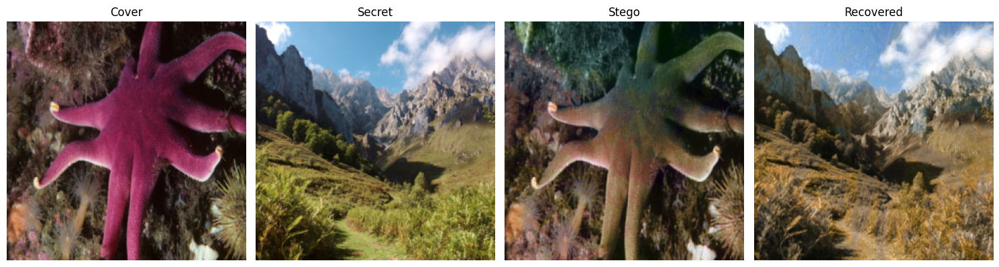

In [ ]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()

In [75]:
#Proposed (UNet + Multi-Scale)

In [76]:
#tarif dataset

class DIV2KPairDataset(Dataset):
    def __init__(self, cover_dir, secret_dir, transform=None, max_images=500):
        self.cover_paths = sorted(glob.glob(os.path.join(cover_dir, '*.png')))[:max_images]
        self.secret_paths = sorted(glob.glob(os.path.join(secret_dir, '*.png')))[:max_images]
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return min(len(self.cover_paths), len(self.secret_paths))

    def __getitem__(self, idx):
        cover = Image.open(self.cover_paths[idx]).convert('RGB')
        secret = Image.open(self.secret_paths[idx]).convert('RGB')
        return self.transform(cover), self.transform(secret)

# بارگذاری داده

dataset = DIV2KPairDataset("DIV2K_train_HR/cover", "DIV2K_train_HR/secret")
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
print(f"Total images: {len(dataset)}")



Total images: 100


In [77]:
import torch
import torch.nn as nn

class UNetMultiScaleHidingBlock(nn.Module):
    def __init__(self):
        super().__init__()

        # --- Encoder ---
        self.enc1 = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU()
        )

        # --- Bottleneck ---
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU()
        )

        # --- Multi-Scale ---
        self.conv1x1 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=1),
            nn.ReLU()
        )
        self.conv3x3 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.conv5x5 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=5, padding=2),
            nn.ReLU()
        )

        # --- Decoder ---
        self.up = nn.Sequential(
            nn.ConvTranspose2d(64 * 3, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU()
        )
        self.final = nn.Sequential(
            nn.Conv2d(64 + 32, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 3, kernel_size=3, padding=1)  # RGB output
        )

    def forward(self, cover, secret):
        x = torch.cat([cover, secret], dim=1)

        # --- Encoder ---
        e1 = self.enc1(x)
        e2 = self.enc2(e1)

        # --- Bottleneck ---
        b = self.bottleneck(e2)

        # --- Multi-Scale ---
        x1 = self.conv1x1(b)
        x2 = self.conv3x3(b)
        x3 = self.conv5x5(b)
        ms_fused = torch.cat([x1, x2, x3], dim=1)

        # --- Decoder ---
        d1 = self.up(ms_fused)
        d1_cat = torch.cat([d1, e1], dim=1)
        out = self.final(d1_cat)

        return out


In [78]:
hiding_net = UNetMultiScaleHidingBlock().to(device)
reveal_net = SimpleRevealingBlock().to(device)

In [79]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)

In [80]:
#amoozesh model (epoch = 100)

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)

for epoch in range(100):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:18<00:00,  1.38it/s]


[Epoch 1] Loss: 0.1324


100%|██████████| 25/25 [00:20<00:00,  1.21it/s]


[Epoch 2] Loss: 0.0567


100%|██████████| 25/25 [00:21<00:00,  1.17it/s]


[Epoch 3] Loss: 0.0303


100%|██████████| 25/25 [00:24<00:00,  1.01it/s]


[Epoch 4] Loss: 0.0245


100%|██████████| 25/25 [00:18<00:00,  1.38it/s]


[Epoch 5] Loss: 0.0225


100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


[Epoch 6] Loss: 0.0199


100%|██████████| 25/25 [00:20<00:00,  1.25it/s]


[Epoch 7] Loss: 0.0186


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


[Epoch 8] Loss: 0.0166


100%|██████████| 25/25 [00:21<00:00,  1.18it/s]


[Epoch 9] Loss: 0.0177


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 10] Loss: 0.0161


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 11] Loss: 0.0146


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 12] Loss: 0.0149


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 13] Loss: 0.0135


100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


[Epoch 14] Loss: 0.0143


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 15] Loss: 0.0150


100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


[Epoch 16] Loss: 0.0134


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 17] Loss: 0.0145


100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


[Epoch 18] Loss: 0.0133


100%|██████████| 25/25 [00:15<00:00,  1.62it/s]


[Epoch 19] Loss: 0.0120


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 20] Loss: 0.0121


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 21] Loss: 0.0170


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 22] Loss: 0.0129


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 23] Loss: 0.0120


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 24] Loss: 0.0114


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 25] Loss: 0.0112


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 26] Loss: 0.0117


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 27] Loss: 0.0112


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 28] Loss: 0.0114


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 29] Loss: 0.0110


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 30] Loss: 0.0114


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 31] Loss: 0.0105


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 32] Loss: 0.0106


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 33] Loss: 0.0133


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 34] Loss: 0.0121


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 35] Loss: 0.0106


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 36] Loss: 0.0105


100%|██████████| 25/25 [00:14<00:00,  1.72it/s]


[Epoch 37] Loss: 0.0111


100%|██████████| 25/25 [00:14<00:00,  1.69it/s]


[Epoch 38] Loss: 0.0151


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 39] Loss: 0.0130


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 40] Loss: 0.0110


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 41] Loss: 0.0103


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 42] Loss: 0.0104


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 43] Loss: 0.0105


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 44] Loss: 0.0132


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 45] Loss: 0.0145


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 46] Loss: 0.0110


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 47] Loss: 0.0103


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 48] Loss: 0.0101


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 49] Loss: 0.0097


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 50] Loss: 0.0100


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 51] Loss: 0.0098


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 52] Loss: 0.0119


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 53] Loss: 0.0143


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 54] Loss: 0.0104


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 55] Loss: 0.0098


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 56] Loss: 0.0095


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 57] Loss: 0.0093


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 58] Loss: 0.0096


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 59] Loss: 0.0094


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 60] Loss: 0.0101


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 61] Loss: 0.0094


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 62] Loss: 0.0100


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 63] Loss: 0.0109


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 64] Loss: 0.0103


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 65] Loss: 0.0092


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 66] Loss: 0.0092


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 67] Loss: 0.0113


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 68] Loss: 0.0105


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 69] Loss: 0.0096


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 70] Loss: 0.0096


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 71] Loss: 0.0091


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 72] Loss: 0.0091


100%|██████████| 25/25 [00:14<00:00,  1.71it/s]


[Epoch 73] Loss: 0.0106


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 74] Loss: 0.0112


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 75] Loss: 0.0095


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 76] Loss: 0.0098


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 77] Loss: 0.0092


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 78] Loss: 0.0090


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 79] Loss: 0.0088


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 80] Loss: 0.0091


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 81] Loss: 0.0094


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 82] Loss: 0.0091


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 83] Loss: 0.0087


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 84] Loss: 0.0087


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 85] Loss: 0.0091


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 86] Loss: 0.0089


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 87] Loss: 0.0096


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 88] Loss: 0.0106


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 89] Loss: 0.0085


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 90] Loss: 0.0082


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 91] Loss: 0.0085


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 92] Loss: 0.0083


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 93] Loss: 0.0084


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 94] Loss: 0.0088


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 95] Loss: 0.0183


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]


[Epoch 96] Loss: 0.0168


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 97] Loss: 0.0114


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 98] Loss: 0.0095


100%|██████████| 25/25 [00:14<00:00,  1.76it/s]


[Epoch 99] Loss: 0.0092


100%|██████████| 25/25 [00:14<00:00,  1.77it/s]

[Epoch 100] Loss: 0.0088


In [81]:
#test nahayi 

cover, secret = dataset[0]
cover = cover.unsqueeze(0).to(device)
secret = secret.unsqueeze(0).to(device)

with torch.no_grad():
    stego = hiding_net(cover, secret)
    recovered = reveal_net(stego)

print("PSNR:", psnr(secret[0], recovered[0]))
print("SSIM:", compute_ssim(secret[0], recovered[0]))

PSNR: 27.05979306087789
SSIM: 0.91138047


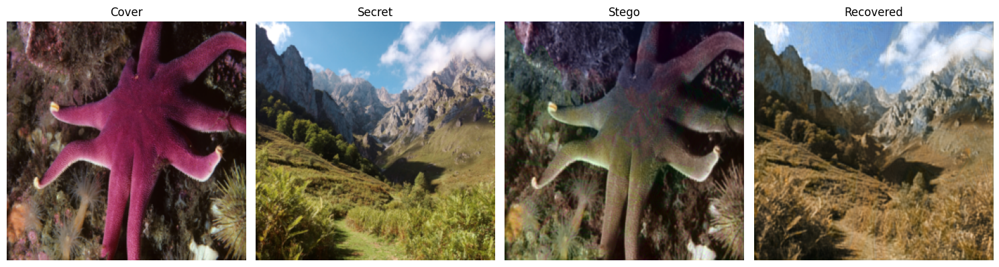

In [ ]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()

In [83]:
#Embedding Block + Proposed

In [84]:
#tarif dataset

class DIV2KPairDataset(Dataset):
    def __init__(self, cover_dir, secret_dir, transform=None, max_images=500):
        self.cover_paths = sorted(glob.glob(os.path.join(cover_dir, '*.png')))[:max_images]
        self.secret_paths = sorted(glob.glob(os.path.join(secret_dir, '*.png')))[:max_images]
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return min(len(self.cover_paths), len(self.secret_paths))

    def __getitem__(self, idx):
        cover = Image.open(self.cover_paths[idx]).convert('RGB')
        secret = Image.open(self.secret_paths[idx]).convert('RGB')
        return self.transform(cover), self.transform(secret)

# بارگذاری داده

dataset = DIV2KPairDataset("DIV2K_train_HR/cover", "DIV2K_train_HR/secret")
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
print(f"Total images: {len(dataset)}")



Total images: 100


In [85]:
import torch
import torch.nn as nn

class EmbeddingBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 3, kernel_size=3, padding=1),  # حفظ ساختار RGB
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.encoder(x)

class FullHidingNet(nn.Module):
    def __init__(self):
        super().__init__()

        # Embedding Block برای فشرده‌سازی تصویر محرمانه
        self.embedding = EmbeddingBlock()

        # Encoder سبک UNet
        self.enc1 = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # Downsample
            nn.ReLU()
        )

        # Multi-Scale در Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.conv1x1 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=1),
            nn.ReLU()
        )
        self.conv3x3 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.conv5x5 = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=5, padding=2),
            nn.ReLU()
        )

        # Decoder سبک UNet + skip
        self.up = nn.Sequential(
            nn.ConvTranspose2d(64 * 3, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU()
        )
        self.final = nn.Sequential(
            nn.Conv2d(64 + 32, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 3, kernel_size=3, padding=1)  # خروجی stego image
        )

    def forward(self, cover, secret):
        # ابتدا تصویر محرمانه را فشرده‌سازی کن
        embedded_secret = self.embedding(secret)

        # ترکیب اولیه
        x = torch.cat([cover, embedded_secret], dim=1)

        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(e1)

        # Bottleneck + Multi-Scale
        b = self.bottleneck(e2)
        x1 = self.conv1x1(b)
        x2 = self.conv3x3(b)
        x3 = self.conv5x5(b)
        ms_fused = torch.cat([x1, x2, x3], dim=1)

        # Decoder + Skip connection
        d1 = self.up(ms_fused)
        d1_cat = torch.cat([d1, e1], dim=1)
        out = self.final(d1_cat)

        return out


In [86]:
hiding_net = FullHidingNet().to(device)
reveal_net = SimpleRevealingBlock().to(device) 

In [87]:
#function PSNR va SSIM

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(1.0 / np.sqrt(mse.item()))

def compute_ssim(img1, img2):
    img1_np = img1.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    img2_np = img2.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32)
    return ssim(img1_np, img2_np, data_range=1.0, channel_axis=2)

In [88]:
#amoozesh model (epoch = 100)

criterion = nn.MSELoss()
optimizer = optim.Adam(list(hiding_net.parameters()) + list(reveal_net.parameters()), lr=1e-3)

for epoch in range(100):
    total_loss = 0.0
    for cover, secret in tqdm(dataloader):
        cover = cover.to(device)
        secret = secret.to(device)

        stego = hiding_net(cover, secret)
        recovered = reveal_net(stego)

        loss_stego = criterion(stego, cover)
        loss_recover = criterion(recovered, secret)
        loss = loss_stego + loss_recover

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    print(f"[Epoch {epoch+1}] Loss: {total_loss/len(dataloader):.4f}")

100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 1] Loss: 0.1909


100%|██████████| 25/25 [00:14<00:00,  1.71it/s]


[Epoch 2] Loss: 0.0958


100%|██████████| 25/25 [00:14<00:00,  1.71it/s]


[Epoch 3] Loss: 0.0672


100%|██████████| 25/25 [00:14<00:00,  1.71it/s]


[Epoch 4] Loss: 0.0339


100%|██████████| 25/25 [00:14<00:00,  1.67it/s]


[Epoch 5] Loss: 0.0244


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 6] Loss: 0.0223


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 7] Loss: 0.0288


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 8] Loss: 0.0245


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 9] Loss: 0.0203


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 10] Loss: 0.0183


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 11] Loss: 0.0172


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 12] Loss: 0.0169


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 13] Loss: 0.0156


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 14] Loss: 0.0158


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 15] Loss: 0.0177


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 16] Loss: 0.0164


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 17] Loss: 0.0189


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 18] Loss: 0.0156


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 19] Loss: 0.0151


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 20] Loss: 0.0149


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 21] Loss: 0.0142


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 22] Loss: 0.0139


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 23] Loss: 0.0142


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 24] Loss: 0.0206


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 25] Loss: 0.0162


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 26] Loss: 0.0143


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 27] Loss: 0.0133


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 28] Loss: 0.0137


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 29] Loss: 0.0132


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 30] Loss: 0.0133


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 31] Loss: 0.0149


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 32] Loss: 0.0142


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 33] Loss: 0.0133


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 34] Loss: 0.0127


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 35] Loss: 0.0129


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 36] Loss: 0.0125


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 37] Loss: 0.0132


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 38] Loss: 0.0188


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 39] Loss: 0.0184


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 40] Loss: 0.0149


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 41] Loss: 0.0131


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 42] Loss: 0.0127


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 43] Loss: 0.0123


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 44] Loss: 0.0120


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 45] Loss: 0.0132


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 46] Loss: 0.0126


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 47] Loss: 0.0125


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 48] Loss: 0.0123


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 49] Loss: 0.0131


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 50] Loss: 0.0124


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 51] Loss: 0.0118


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 52] Loss: 0.0122


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 53] Loss: 0.0125


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 54] Loss: 0.0119


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 55] Loss: 0.0130


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 56] Loss: 0.0154


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 57] Loss: 0.0140


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 58] Loss: 0.0119


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 59] Loss: 0.0120


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 60] Loss: 0.0119


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 61] Loss: 0.0122


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 62] Loss: 0.0126


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 63] Loss: 0.0117


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 64] Loss: 0.0139


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 65] Loss: 0.0117


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 66] Loss: 0.0112


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 67] Loss: 0.0119


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 68] Loss: 0.0114


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 69] Loss: 0.0140


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 70] Loss: 0.0151


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 71] Loss: 0.0121


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 72] Loss: 0.0113


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 73] Loss: 0.0111


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 74] Loss: 0.0110


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 75] Loss: 0.0112


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 76] Loss: 0.0112


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 77] Loss: 0.0113


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 78] Loss: 0.0107


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 79] Loss: 0.0107


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 80] Loss: 0.0112


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 81] Loss: 0.0108


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 82] Loss: 0.0105


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 83] Loss: 0.0126


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 84] Loss: 0.0165


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 85] Loss: 0.0118


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 86] Loss: 0.0107


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 87] Loss: 0.0110


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 88] Loss: 0.0108


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 89] Loss: 0.0100


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 90] Loss: 0.0101


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 91] Loss: 0.0102


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 92] Loss: 0.0100


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 93] Loss: 0.0108


100%|██████████| 25/25 [00:14<00:00,  1.73it/s]


[Epoch 94] Loss: 0.0174


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 95] Loss: 0.0110


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 96] Loss: 0.0100


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 97] Loss: 0.0097


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]


[Epoch 98] Loss: 0.0098


100%|██████████| 25/25 [00:14<00:00,  1.74it/s]


[Epoch 99] Loss: 0.0102


100%|██████████| 25/25 [00:14<00:00,  1.75it/s]

[Epoch 100] Loss: 0.0107


In [89]:
#test nahayi 

cover, secret = dataset[0]
cover = cover.unsqueeze(0).to(device)
secret = secret.unsqueeze(0).to(device)

with torch.no_grad():
    stego = hiding_net(cover, secret)
    recovered = reveal_net(stego)

print("PSNR:", psnr(secret[0], recovered[0]))
print("SSIM:", compute_ssim(secret[0], recovered[0]))

PSNR: 23.69978449286396
SSIM: 0.85921746


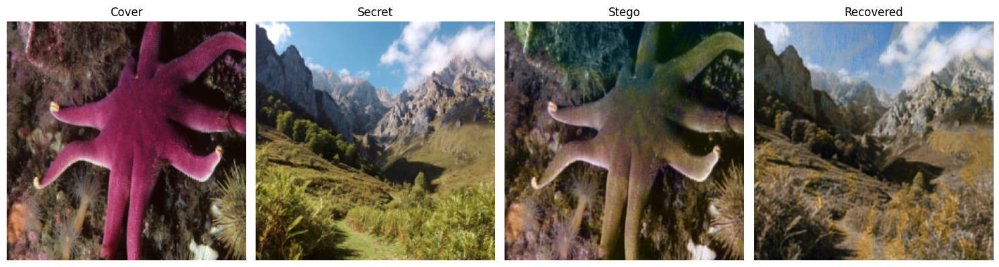

In [ ]:
#namayesh khorooji

def show(img, title=""):
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = np.clip(img * 255, 0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
show(cover[0], "Cover")

plt.subplot(1, 4, 2)
show(secret[0], "Secret")

plt.subplot(1, 4, 3)
show(stego[0], "Stego")

plt.subplot(1, 4, 4)
show(recovered[0], "Recovered")

plt.tight_layout()
plt.show()

In [91]:
#SRNET

In [92]:
import os
from tqdm import tqdm
import torchvision.transforms as transforms
from PIL import Image

# مسیرها
cover_dir = "DIV2K_train_HR/cover"
secret_dir = "DIV2K_train_HR/secret"
stego_dir = "DIV2K_train_HR/stego"
os.makedirs(stego_dir, exist_ok=True)

# Dataset برای cover و secret
dataset = DIV2KPairDataset(cover_dir, secret_dir, max_images=400)

# مدل در حالت ارزیابی
hiding_net.eval()

with torch.no_grad():
    for idx, (cover, secret) in tqdm(enumerate(dataset), total=len(dataset)):
        cover = cover.unsqueeze(0).to(device)
        secret = secret.unsqueeze(0).to(device)

        # ساخت stego
        stego = hiding_net(cover, secret)[0].cpu().permute(1, 2, 0).numpy()
        stego = np.clip(stego * 255, 0, 255).astype(np.uint8)
        stego_img = Image.fromarray(stego)

        # ذخیره
        stego_img.save(os.path.join(stego_dir, f"stego_{idx}.png"))

print("تصاویر stego با موفقیت ذخیره شدند.")


100%|██████████| 100/100 [00:19<00:00,  5.13it/s]

تصاویر stego با موفقیت ذخیره شدند.


In [93]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
import os
import glob

class StegoDetectionDataset(Dataset):
    def __init__(self, cover_dir, stego_dir, transform=None, max_images=400):
        self.cover_paths = sorted(glob.glob(os.path.join(cover_dir, '*.png')))[:max_images]
        self.stego_paths = sorted(glob.glob(os.path.join(stego_dir, '*.png')))[:max_images]
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])
        self.all_paths = self.cover_paths + self.stego_paths
        self.labels = [0]*len(self.cover_paths) + [1]*len(self.stego_paths)

    def __len__(self):
        return len(self.all_paths)

    def __getitem__(self, idx):
        img = Image.open(self.all_paths[idx]).convert('RGB')
        img = self.transform(img)
        label = self.labels[idx]
        return img, label


In [94]:
# مسیرها
cover_dir = "DIV2K_train_HR/cover"
stego_dir = "DIV2K_train_HR/stego"

# Dataset و DataLoader
srnet_dataset = StegoDetectionDataset(cover_dir, stego_dir)
srnet_loader = DataLoader(srnet_dataset, batch_size=8, shuffle=True)

print("DataLoader آماده است.")


DataLoader آماده است.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# نوع لایه 1: Conv → BN → ReLU
class LayerType1(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(LayerType1, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(self.bn(self.conv(x)))

# نوع لایه 2: Residual Block (با skip connection)
class LayerType2(nn.Module):
    def __init__(self, channels):
        super(LayerType2, self).__init__()
        self.conv1 = LayerType1(channels, channels)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn = nn.BatchNorm2d(channels)

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn(self.conv2(out))
        return F.relu(out + x)

# نوع لایه 3: Downsampling + Residual
class LayerType3(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(LayerType3, self).__init__()
        self.downsample = nn.Sequential(
            LayerType1(in_channels, out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(out_channels)
        )
        self.shortcut = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=2),
            nn.BatchNorm2d(out_channels)
        )

    def forward(self, x):
        return F.relu(self.downsample(x) + self.shortcut(x))

# نوع لایه 4: Global Average Pooling
class LayerType4(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(LayerType4, self).__init__()
        self.conv = LayerType1(in_channels, out_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.gap = nn.AdaptiveAvgPool2d((1, 1))  

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return self.gap(x)

# ساختار اصلی مدل SRNet برای تشخیص استگو vs کاور
class SRNet(nn.Module):
    def __init__(self, num_classes=2):
        super(SRNet, self).__init__()
        self.layer1 = LayerType1(3, 64)
        self.layer2 = LayerType1(64, 16)

        self.layer3 = LayerType2(16)
        self.layer4 = LayerType2(16)
        self.layer5 = LayerType2(16)
        self.layer6 = LayerType2(16)
        self.layer7 = LayerType2(16)

        self.layer8 = LayerType3(16, 64)
        self.layer9 = LayerType3(64, 128)
        self.layer10 = LayerType3(128, 256)
        self.layer11 = LayerType3(256, 512)

        self.layer12 = LayerType4(512, 512)
        self.fc = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)

        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = self.layer6(x)
        x = self.layer7(x)

        x = self.layer8(x)
        x = self.layer9(x)
        x = self.layer10(x)
        x = self.layer11(x)

        x = self.layer12(x)
        x = x.view(x.size(0), -1)  
        x = self.fc(x)
        return x


In [ ]:
import os
import glob
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# تنظیم مسیرها
cover_dir = "DIV2K_train_HR/cover"
stego_dir = "DIV2K_train_HR/stego"

# کلاس Dataset برای SRNet
class StegoDataset(Dataset):
    def __init__(self, cover_dir, stego_dir, transform=None):
        self.cover_paths = sorted(glob.glob(os.path.join(cover_dir, "*.png")))
        self.stego_paths = sorted(glob.glob(os.path.join(stego_dir, "*.png")))
        self.transform = transform or transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])

        self.data = [(path, 0) for path in self.cover_paths] + [(path, 1) for path in self.stego_paths]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        img = Image.open(img_path).convert("RGB")
        img = self.transform(img)
        return img, torch.tensor(label, dtype=torch.long)

# ایجاد DataLoader
dataset = StegoDataset(cover_dir, stego_dir)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

print(f"Total samples loaded: {len(dataset)}")


Total samples loaded: 200


In [ ]:
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

# استفاده از مدل SRNet
srnet = SRNet().to(device)

# تعریف Loss و Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(srnet.parameters(), lr=1e-4)

# آموزش مدل 
epochs = 5

for epoch in range(epochs):
    srnet.train()
    total_loss = 0
    correct = 0
    total = 0

    for images, labels in tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}"):
        images = images.to(device)
        labels = labels.to(device)

        # پیش‌بینی
        outputs = srnet(images)
        loss = criterion(outputs, labels)

        # آپدیت مدل
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # آمار
        total_loss += loss.item()
        preds = torch.argmax(outputs, dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    accuracy = 100 * correct / total
    print(f"Epoch {epoch+1} | Loss: {total_loss/len(dataloader):.4f} | Accuracy: {accuracy:.2f}%")


Epoch 1/5: 100%|██████████| 25/25 [00:11<00:00,  2.09it/s]


Epoch 1 | Loss: 0.7739 | Accuracy: 46.50%


Epoch 2/5: 100%|██████████| 25/25 [00:11<00:00,  2.12it/s]


Epoch 2 | Loss: 0.6901 | Accuracy: 56.50%


Epoch 3/5: 100%|██████████| 25/25 [00:11<00:00,  2.14it/s]


Epoch 3 | Loss: 0.6634 | Accuracy: 64.50%


Epoch 4/5: 100%|██████████| 25/25 [00:11<00:00,  2.13it/s]


Epoch 4 | Loss: 0.5232 | Accuracy: 72.50%


Epoch 5/5: 100%|██████████| 25/25 [00:11<00:00,  2.14it/s]

Epoch 5 | Loss: 0.4691 | Accuracy: 73.50%


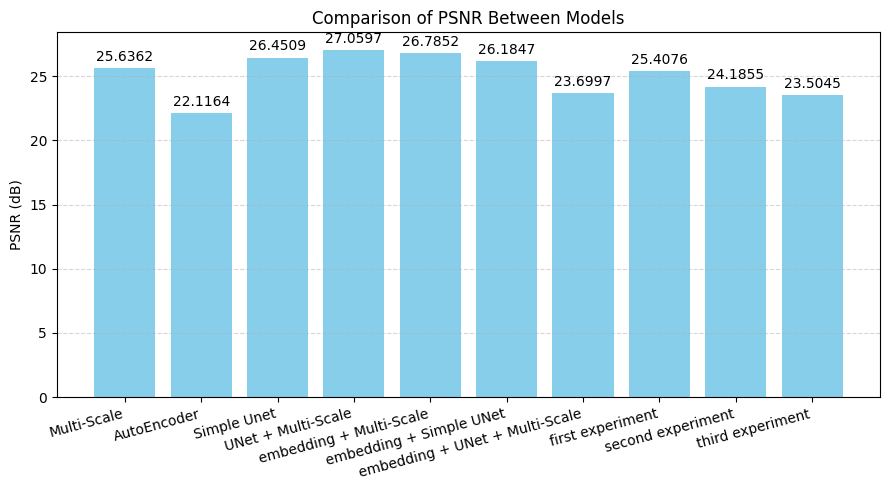

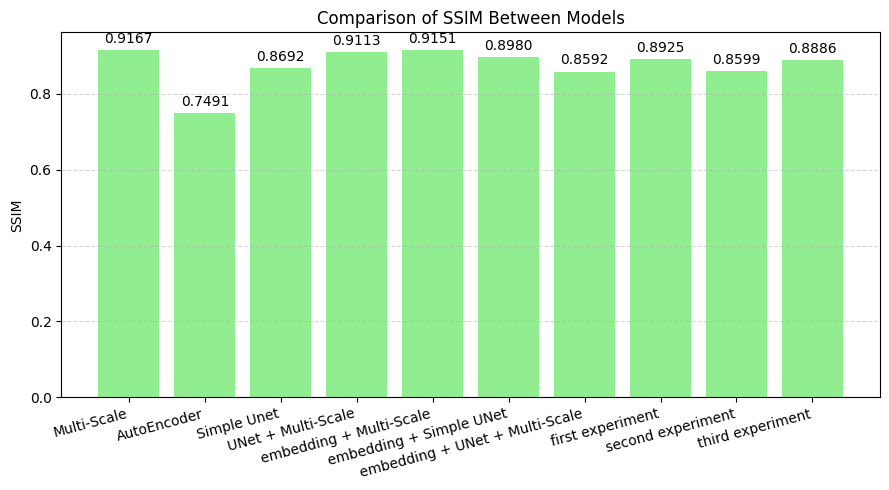

In [1]:
import matplotlib.pyplot as plt
import numpy as np

# نام مدل‌ها
models = ['Multi-Scale','AutoEncoder','Simple Unet','UNet + Multi-Scale','embedding + Multi-Scale','embedding + Simple UNet','embedding + UNet + Multi-Scale','first experiment','second experiment','third experiment']
x = np.arange(len(models))

# مقادیر PSNR و SSIM برای هر مدل
psnr_values = [25.6362,22.1164,26.4509,27.0597,26.7852,26.1847,23.6997,25.4076,24.1855,23.5045]
ssim_values = [0.9167,0.7491,0.8692,0.9113,0.9151,0.8980,0.8592,0.8925,0.8599,0.8886]

def plot_metric(values, title, ylabel, color):
    fig, ax = plt.subplots(figsize=(9, 5))
    bars = ax.bar(x, values, color=color)

    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(models, rotation=15, ha='right')

    # نمایش مقدار عددی بالای ستون‌ها
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',  # مقدار کامل تا 4 رقم اعشار,
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')

    plt.tight_layout()
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

# نمایش نمودار PSNR
plot_metric(psnr_values, 'Comparison of PSNR Between Models', 'PSNR (dB)', 'skyblue')

# نمایش نمودار SSIM
plot_metric(ssim_values, 'Comparison of SSIM Between Models', 'SSIM', 'lightgreen')
